In [1]:
! pip install numpy

In [2]:
! pip install tensorflow

  Using cached numpy-2.1.3-cp310-cp310-win_amd64.whl.metadata (60 kB)
Using cached numpy-2.1.3-cp310-cp310-win_amd64.whl (12.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4


  You can safely remove it manually.


In [3]:
! pip install matplotlib

In [4]:
! pip install scikit-learn

In [5]:
! pip install numpy==1.24.4

  Using cached numpy-1.24.4-cp310-cp310-win_amd64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp310-cp310-win_amd64.whl (14.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 1.24.4 which is incompatible.


In [8]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Parameters
IMG_SIZE = 128
DATA_DIR = r"D:\Retina dataset\dataset"

def load_retina_images(data_dir, img_size):
    images = []
    for label in os.listdir(data_dir):
        class_dir = os.path.join(data_dir, label)
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            try:
                img = load_img(img_path, target_size=(img_size, img_size))
                img_array = img_to_array(img) / 255.0  # Normalize
                images.append(img_array)
            except:
                continue
    return np.array(images)

retina_images = load_retina_images(DATA_DIR, IMG_SIZE)
print("Loaded:", retina_images.shape)


Loaded: (3662, 128, 128, 3)


In [9]:

def load_retina_images(data_dir, img_size):
    images = []
    labels = []
    for label in os.listdir(data_dir):
        class_dir = os.path.join(data_dir, label)
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            try:
                img = load_img(img_path, target_size=(img_size, img_size))
                img_array = img_to_array(img) / 255.0  # Normalize
                images.append(img_array)
                labels.append(label)
            except:
                continue
    return np.array(images), np.array(labels)


In [10]:
retina_images, retina_labels = load_retina_images(DATA_DIR, IMG_SIZE)


In [11]:
print("Loaded:", retina_images.shape)

Loaded: (3662, 128, 128, 3)


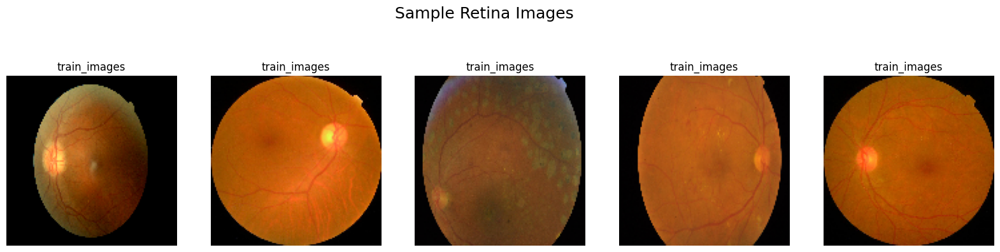

In [12]:
import matplotlib.pyplot as plt

n = 5  # Number of images to display
plt.figure(figsize=(20, 5))

for i in range(n):
    plt.subplot(1, n, i + 1)
    idx = np.random.randint(0, len(retina_images))
    plt.imshow(retina_images[idx])
    plt.title(retina_labels[idx])
    plt.axis('off')  # Hides x and y ticks

plt.suptitle("Sample Retina Images", fontsize=18)
plt.show()


In [13]:
import numpy as np
from tensorflow.keras import layers, Model, backend as K

class Retina_Autoencoder:
        
    def __init__(self,
                 input_dim,
                 encoder_conv_filters,
                 encoder_conv_kernel_size,
                 encoder_conv_strides,
                 decoder_conv_t_filters,
                 decoder_conv_t_kernel_size,
                 decoder_conv_t_strides,
                 z_dim,
                 use_batch_norm = False,
                 use_dropout= False
                ):
        # Retina dataset-specific parameters
        self.input_dim = input_dim  # e.g., (128, 128, 3) for 128x128 RGB images
        self.encoder_conv_filters = encoder_conv_filters
        self.encoder_conv_kernel_size = encoder_conv_kernel_size
        self.encoder_conv_strides = encoder_conv_strides

        self.decoder_conv_t_filters = decoder_conv_t_filters
        self.decoder_conv_t_kernel_size = decoder_conv_t_kernel_size
        self.decoder_conv_t_strides = decoder_conv_t_strides
        self.z_dim = z_dim

        self.use_batch_norm = use_batch_norm
        self.use_dropout = use_dropout

        self.n_layers_encoder = len(encoder_conv_filters)
        self.n_layers_decoder = len(decoder_conv_t_filters)

    def build(self):
        # Encoder
        encoder_input = layers.Input(shape=self.input_dim, name='encoder_input')

        x = encoder_input

        # Encoder Convolution Layers
        for i in range(self.n_layers_encoder):
            conv_layer = layers.Conv2D(
                filters=self.encoder_conv_filters[i],
                kernel_size=self.encoder_conv_kernel_size[i],
                strides=self.encoder_conv_strides[i],
                padding='same',
                name='encoder_conv_' + str(i)
            )
            x = conv_layer(x)

            if self.use_batch_norm:
                x = layers.BatchNormalization()(x)
            
            x = layers.Activation("relu")(x)

            if self.use_dropout:
                x = layers.Dropout(rate=0.25)(x)

        # Get the shape before flattening to reshape in the decoder
        shape_before_flattening = K.int_shape(x)[1:]

        # Flatten and then apply the embedding layer
        x = layers.Flatten()(x)
        embedding = layers.Dense(self.z_dim, name="Embedding")(x)

        # Decoder
        x = layers.Dense(np.prod(shape_before_flattening))(embedding)
        x = layers.Reshape(shape_before_flattening)(x)

        # Decoder Transposed Convolution Layers
        for i in range(self.n_layers_decoder):
            conv_t_layer = layers.Conv2DTranspose(
                filters=self.decoder_conv_t_filters[i],
                kernel_size=self.decoder_conv_t_kernel_size[i],
                strides=self.decoder_conv_t_strides[i],
                padding='same',
                name='decoder_conv_t_' + str(i)
            )
            x = conv_t_layer(x)

            # Apply batch norm, activation, and dropout as required
            if i < self.n_layers_decoder - 1:
                if self.use_batch_norm:
                    x = layers.BatchNormalization()(x)
                x = layers.Activation('relu')(x)
                if self.use_dropout:
                    x = layers.Dropout(rate=0.25)(x)
            else:
                # Use sigmoid activation in the last layer for image output (scaled [0, 1])
                x = layers.Activation('sigmoid')(x)

        decoder_output = x

        # Final model
        ae = Model(inputs=encoder_input, outputs=decoder_output, name="Retina_Autoencoder")
        print(ae.summary())
        return ae

    def __str__(self):
        return "RETINA AUTOENCODER"



In [14]:
# Define image shape for retina dataset (RGB, 128x128)
IMG_SHAPE = (128, 128, 3)  # You can change this if your dataset uses grayscale, i.e., (128, 128, 1)

# Initialize Retina Autoencoder with the desired parameters
retina_ae = Retina_Autoencoder(input_dim=IMG_SHAPE,
                                encoder_conv_filters=[32, 64, 64, 64],   # Example encoder filters
                                encoder_conv_kernel_size=[3, 3, 3, 3],   # Example kernel sizes
                                encoder_conv_strides=[2, 2, 2, 2],       # Example strides
                                decoder_conv_t_filters=[64, 64, 32, 3],  # Example decoder filters
                                decoder_conv_t_kernel_size=[3, 3, 3, 3], # Example kernel sizes
                                decoder_conv_t_strides=[2, 2, 2, 2],     # Example strides
                                z_dim=128,                                # Latent space size
                                use_batch_norm=False,                     # Set to True if you want batch normalization
                                use_dropout=False)                        # Set to True if you want dropout layers

# Build the model
model = retina_ae.build()



Model: "Retina_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_0 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Embedding (Dense)               │ (None, 128)            │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │       528,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_0                │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_1                │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_2                │ (None, 64, 64, 32)     │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_3                │ (None, 128, 128, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 128, 128, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,239,235 (4.73 MB)

 Trainable params: 1,239,235 (4.73 MB)

 Non-trainable params: 0 (0.00 B)

None


In [15]:
from tensorflow.keras.callbacks import Callback
import numpy as np
import matplotlib.pyplot as plt

# Training Hyperparameters
LR = 1e-3
BS = 16
EPOCHS = 20

# Example input image arrays (replace these with your actual retina image arrays)
# Ensure train_imgs, val_imgs are numpy arrays of shape (n_samples, 128, 128, 3) for RGB retina images
# and train_labels, val_labels are lists of corresponding labels.

# Training and validation image arrays (Assumed to be preprocessed)
train_imgs = ...  # Your training retina images (numpy array)
val_imgs = ...    # Your validation retina images (numpy array)
train_labels = ... # Your training labels (list)
val_labels = ...   # Your validation labels (list)

# Define the ShowLearning callback to visualize the progress
class ShowLearning(Callback):
    def on_epoch_end(self, epoch, logs = {}):       
        # Select some sample images to display
        original_imgs = [
            val_imgs[val_labels.index('RetinaSubject1')],
            val_imgs[val_labels.index('RetinaSubject2')],
            val_imgs[val_labels.index('RetinaSubject3')],
            train_imgs[train_labels.index('RetinaSubject4') + 7],
            val_imgs[val_labels.index('RetinaSubject5')]
        ]
        
        decoded_imgs = []

        for img in original_imgs:
            decoded_imgs.append(self.model.predict(np.array([img]))[0])

        n = len(original_imgs)
        plt.figure(figsize=(20, 7))
        for i in range(1, n + 1):
            # Display original
            ax = plt.subplot(2, n, i)
            plt.imshow(original_imgs[i-1])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            plt.title("Original")    

            # Display reconstruction
            ax = plt.subplot(2, n, i + n)
            plt.imshow(decoded_imgs[i-1])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            plt.title("Reconstructed")

        plt.show()

# Instantiate the callback
show_learning = ShowLearning()

# Prepare callbacks list
callbacks = [show_learning]

# Build the model using the `build` method
model = retina_ae.build()

# Now, compile the model
model.compile(loss='mse', optimizer='adam')



Model: "Retina_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_0 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Embedding (Dense)               │ (None, 128)            │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │       528,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_0                │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_12 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_1                │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_13 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_2                │ (None, 64, 64, 32)     │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_14 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_3                │ (None, 128, 128, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_15 (Activation)      │ (None, 128, 128, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,239,235 (4.73 MB)

 Trainable params: 1,239,235 (4.73 MB)

 Non-trainable params: 0 (0.00 B)

None


Loaded train images shape: (3662, 128, 128, 3)


Model: "Retina_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_0 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_32 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_33 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_34 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_35 (Activation)      │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Dense)               │ (None, 128)            │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4096)           │       528,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_4 (Reshape)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_0                │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_36 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_1                │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_37 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_2                │ (None, 64, 64, 32)     │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_38 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_3                │ (None, 128, 128, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_39 (Activation)      │ (None, 128, 128, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,239,235 (4.73 MB)

 Trainable params: 1,239,235 (4.73 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/stepstep - loss: 0.05


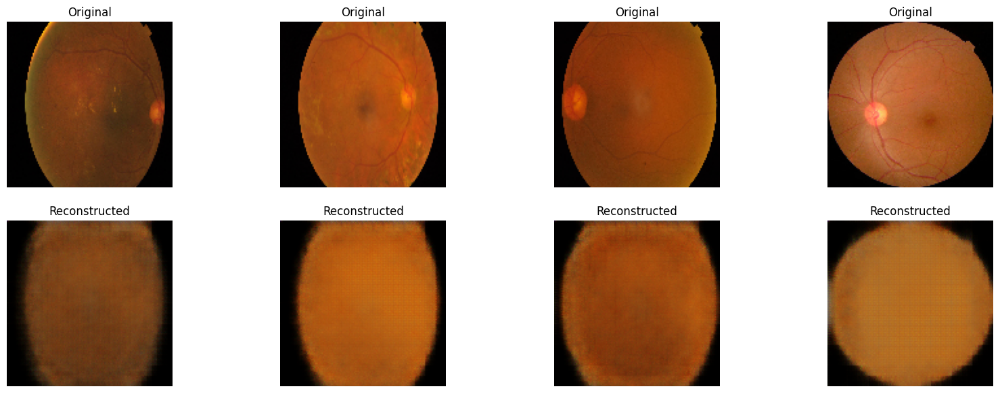

229/229 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0518
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/stepstep - loss: 0.004


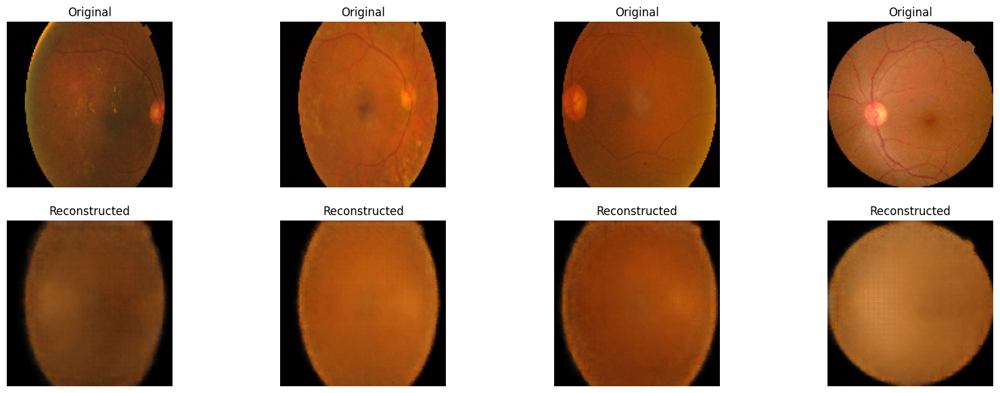

229/229 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0046
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/stepstep - loss: 0.003


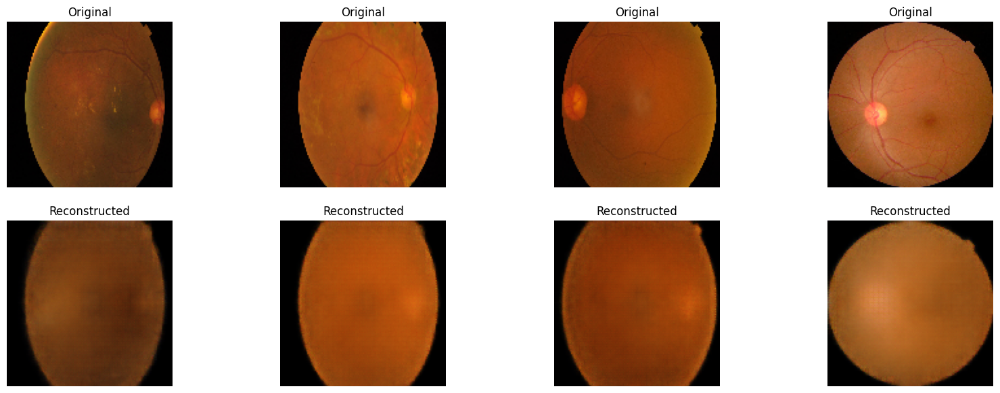

229/229 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.0031
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/stepstep - loss: 0.002


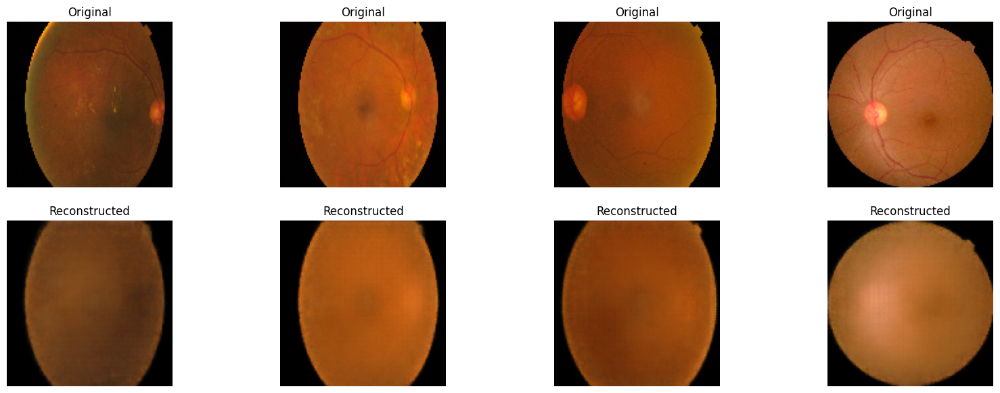

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.0025
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/stepstep - loss: 0.002


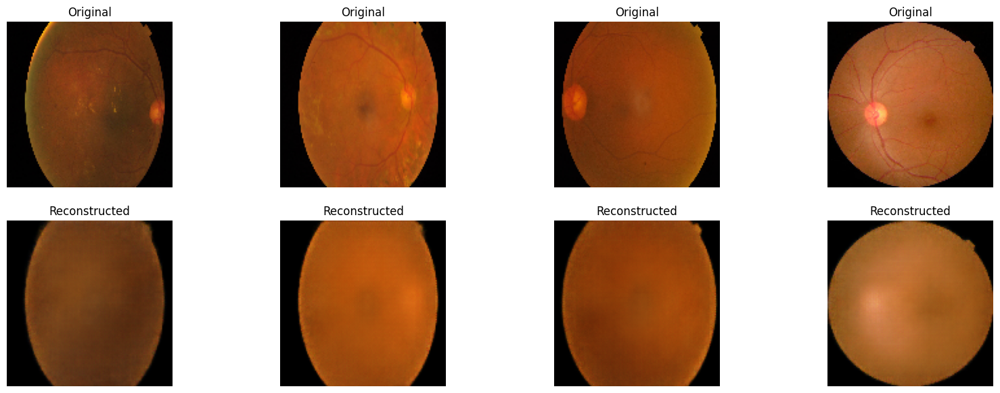

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0021
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/stepstep - loss: 0.001


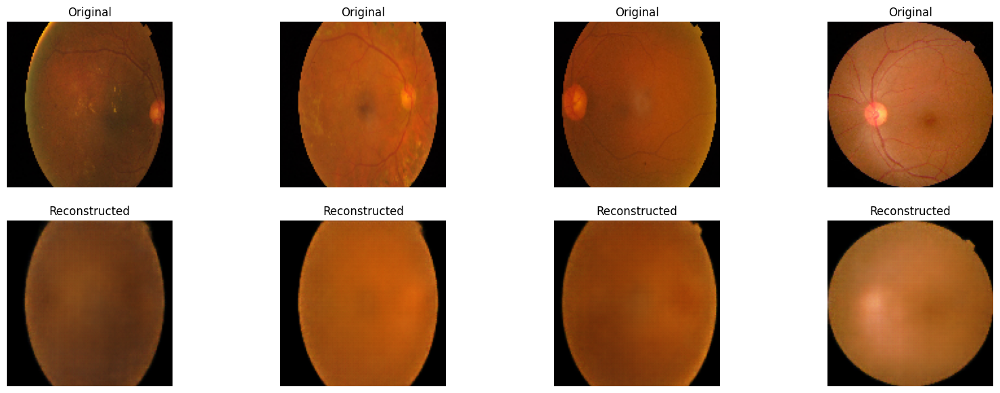

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.0019
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/stepstep - loss: 0.001


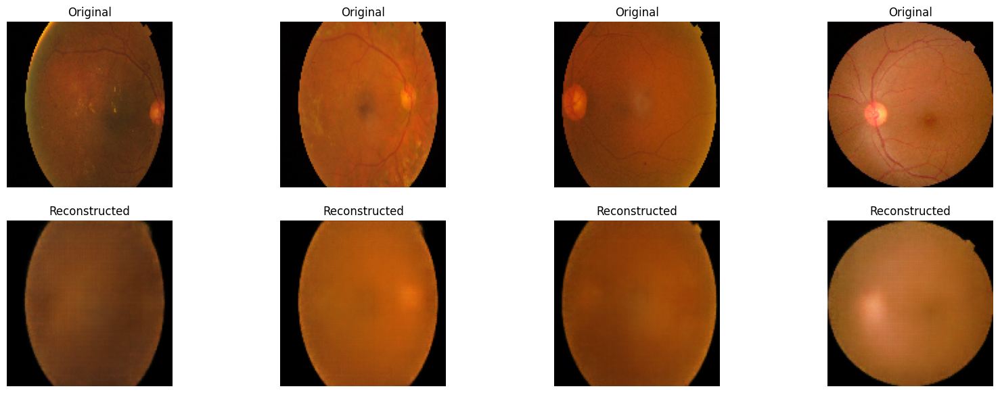

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0017
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/stepstep - loss: 0.001


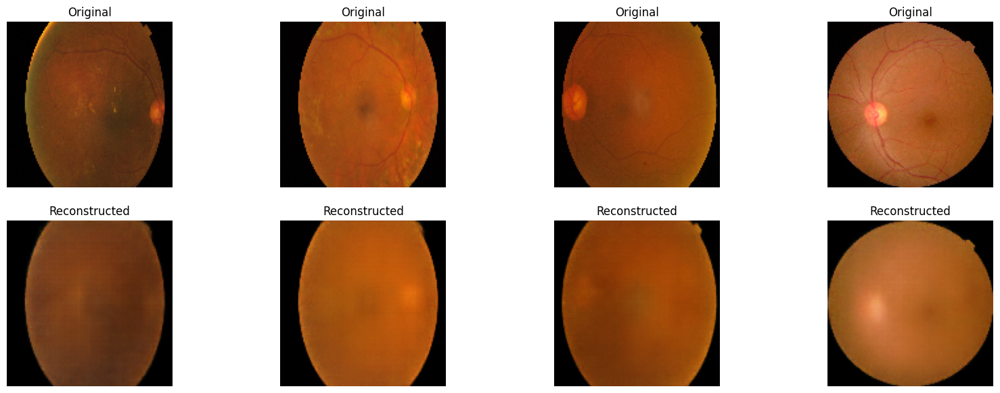

229/229 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0015
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/stepstep - loss: 0.001


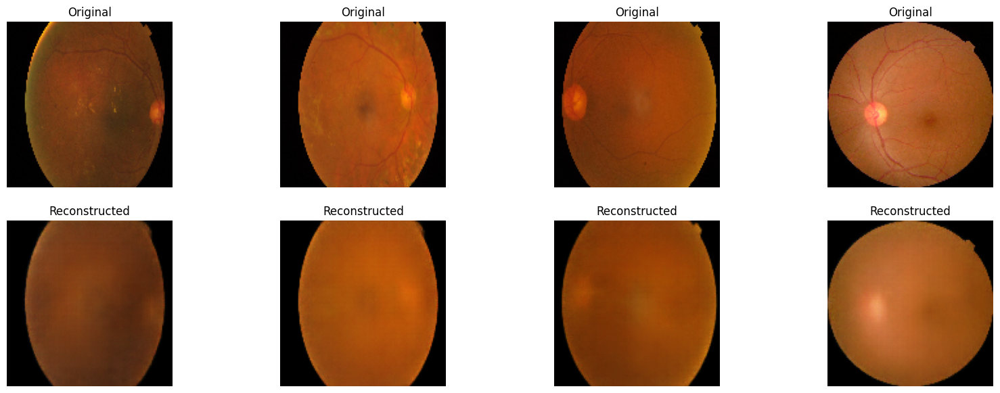

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0014
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/stepstep - loss: 0.001


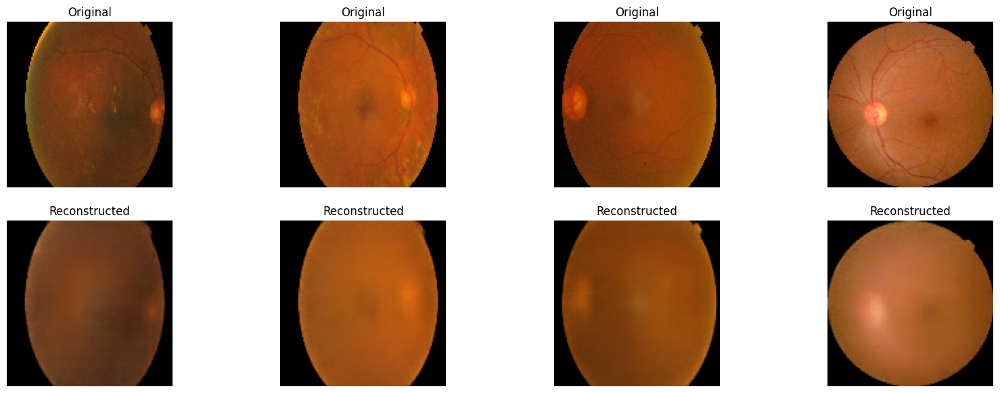

229/229 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.0013
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/stepstep - loss: 0.001


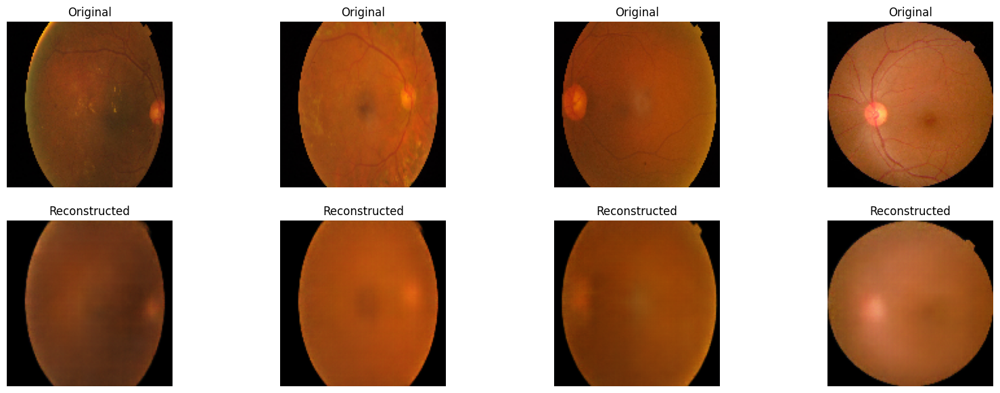

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0012
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/stepstep - loss: 0.001


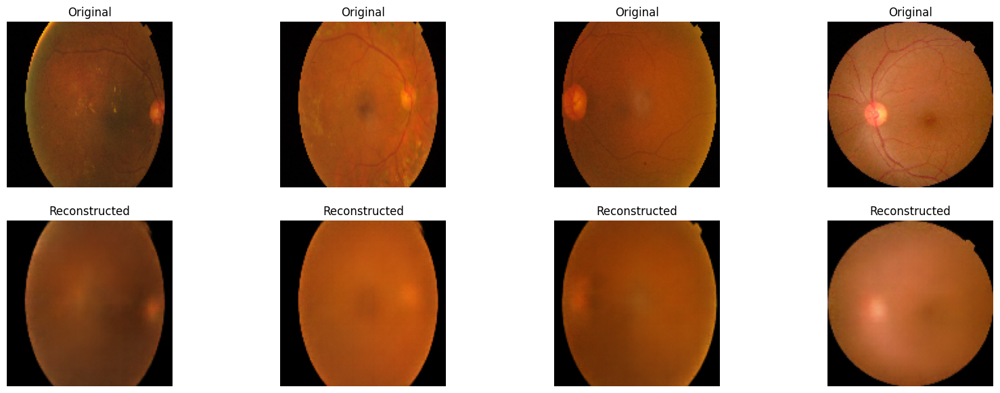

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0011
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/stepstep - loss: 0.001


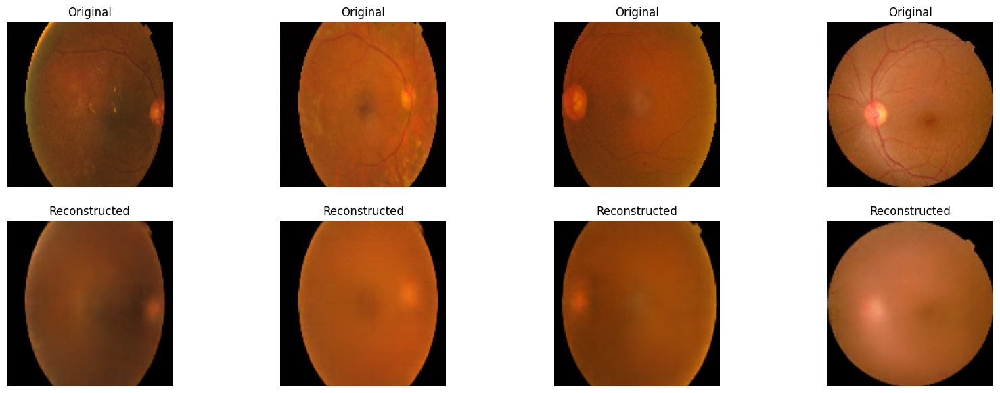

229/229 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.0011
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/stepstep - loss: 0.001


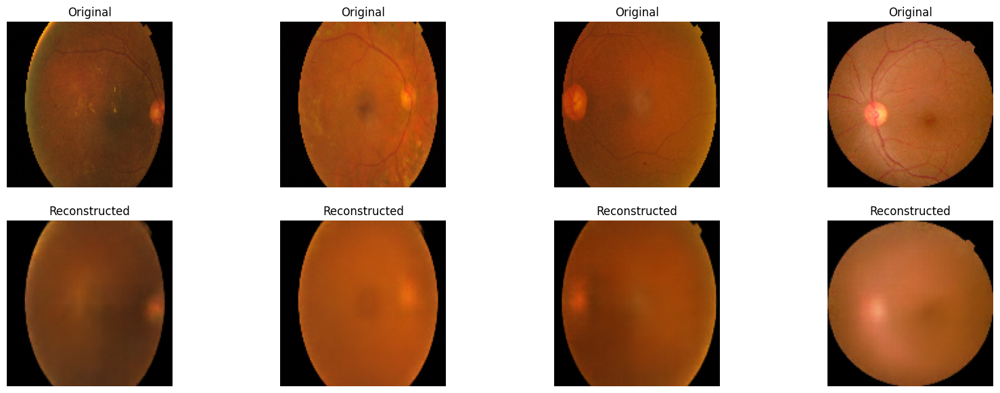

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0010
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/stepstep - loss: 9.7159e-0


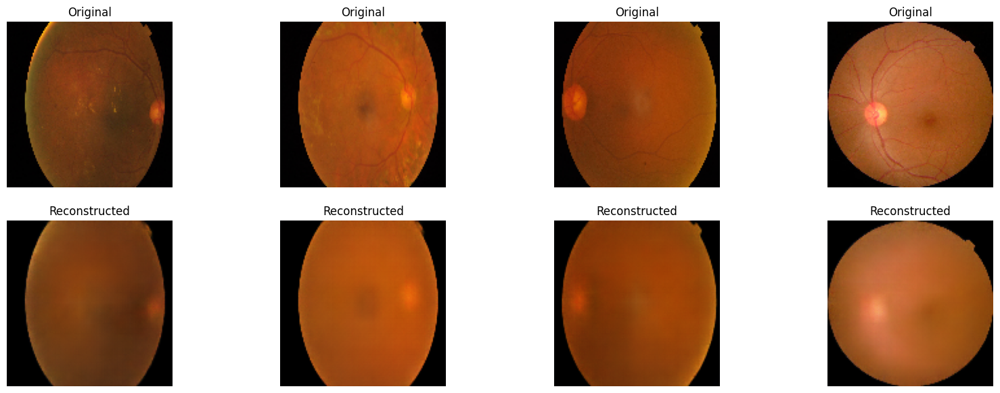

229/229 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 9.7161e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/stepstep - loss: 9.4597e-0


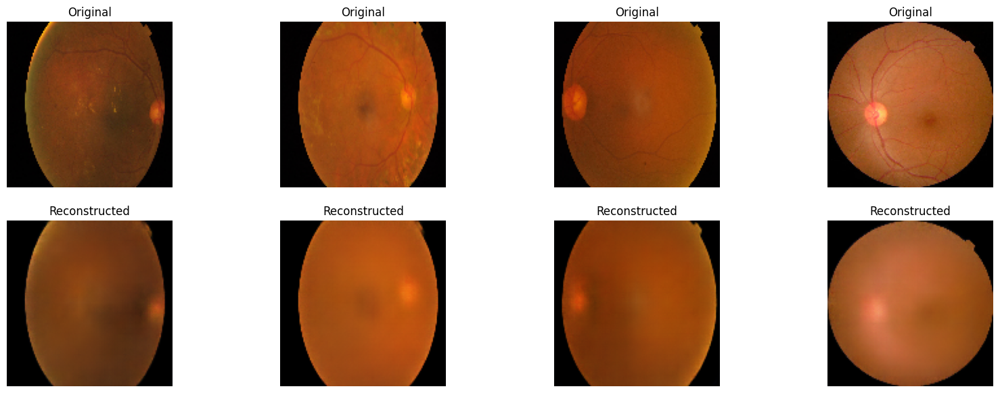

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 9.4588e-04
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/stepstep - loss: 0.001


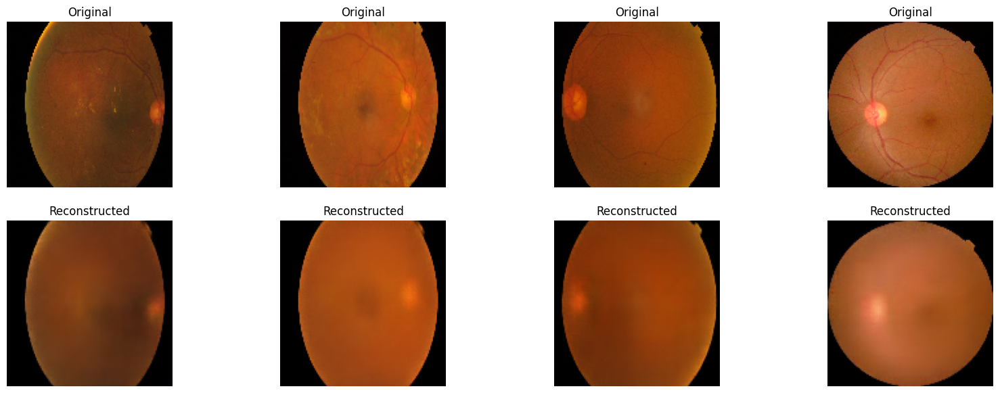

229/229 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.0010
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/stepstep - loss: 8.5758e-0


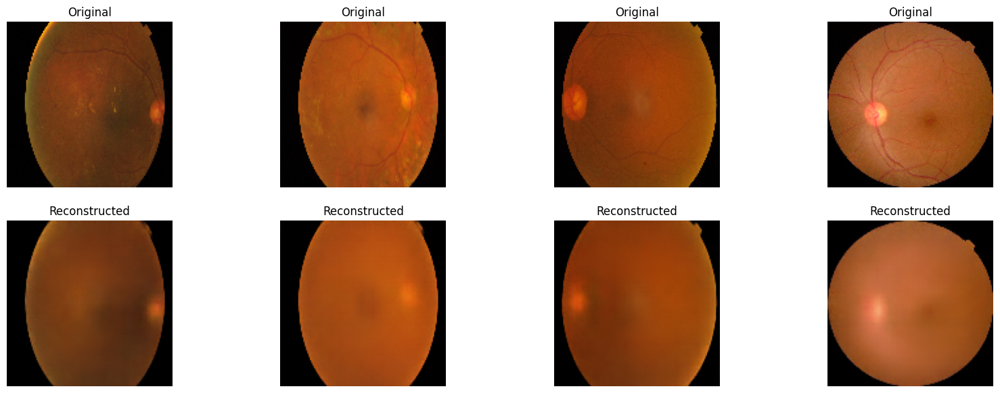

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 8.5753e-04
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/stepstep - loss: 8.4267e-0


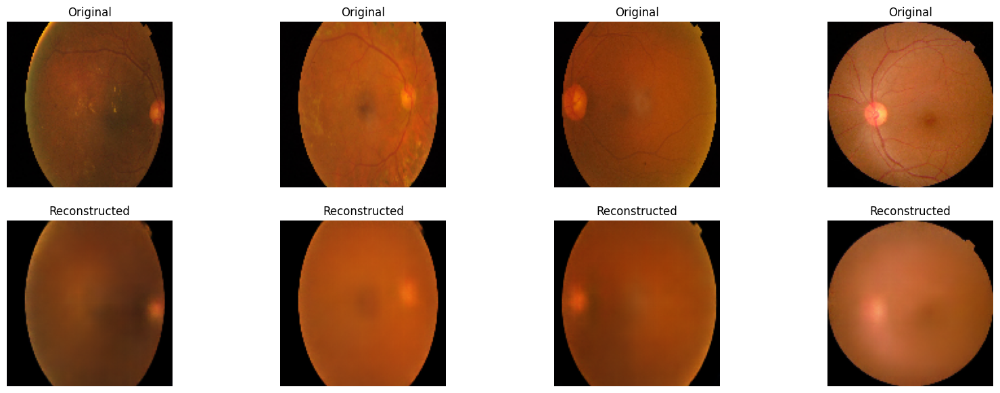

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 8.4263e-04
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/stepstep - loss: 8.5327e-0


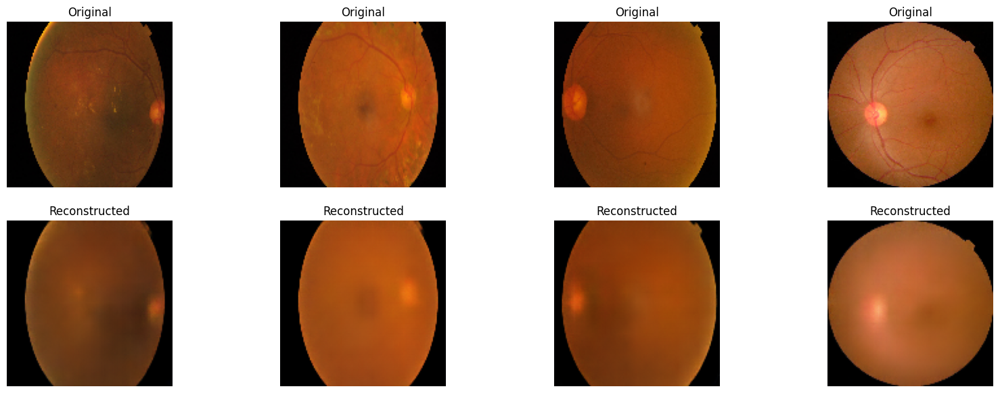

229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 8.5339e-04


In [18]:
# Step 1: Imports
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, Model, backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.preprocessing import image

# Step 2: Load and preprocess images
dataset_path = r'D:\Retina dataset\dataset\train_images'  # <-- Change this if needed
img_size = (128, 128)
train_imgs = []

for img_name in os.listdir(dataset_path):
    img_path = os.path.join(dataset_path, img_name)
    
    # Skip non-image files
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    try:
        img = image.load_img(img_path, target_size=img_size)
        img_array = image.img_to_array(img) / 255.0  # Normalize
        train_imgs.append(img_array)
    except Exception as e:
        print(f"Error loading {img_name}: {e}")

train_imgs = np.array(train_imgs)
print("Loaded train images shape:", train_imgs.shape)

# Step 3: Define the Retina Autoencoder class
class Retina_Autoencoder:
    def __init__(self,
                 input_dim,
                 encoder_conv_filters,
                 encoder_conv_kernel_size,
                 encoder_conv_strides,
                 decoder_conv_t_filters,
                 decoder_conv_t_kernel_size,
                 decoder_conv_t_strides,
                 z_dim,
                 use_batch_norm=False,
                 use_dropout=False):
        
        self.input_dim = input_dim
        self.encoder_conv_filters = encoder_conv_filters
        self.encoder_conv_kernel_size = encoder_conv_kernel_size
        self.encoder_conv_strides = encoder_conv_strides
        self.decoder_conv_t_filters = decoder_conv_t_filters
        self.decoder_conv_t_kernel_size = decoder_conv_t_kernel_size
        self.decoder_conv_t_strides = decoder_conv_t_strides
        self.z_dim = z_dim
        self.use_batch_norm = use_batch_norm
        self.use_dropout = use_dropout
        self.n_layers_encoder = len(encoder_conv_filters)
        self.n_layers_decoder = len(decoder_conv_t_filters)

    def build(self):
        encoder_input = layers.Input(shape=self.input_dim, name='encoder_input')
        x = encoder_input

        # Encoder
        for i in range(self.n_layers_encoder):
            x = layers.Conv2D(
                filters=self.encoder_conv_filters[i],
                kernel_size=self.encoder_conv_kernel_size[i],
                strides=self.encoder_conv_strides[i],
                padding='same',
                name='encoder_conv_' + str(i))(x)

            if self.use_batch_norm:
                x = layers.BatchNormalization()(x)
            x = layers.Activation("relu")(x)
            if self.use_dropout:
                x = layers.Dropout(rate=0.25)(x)

        shape_before_flattening = K.int_shape(x)[1:]
        x = layers.Flatten()(x)
        embedding = layers.Dense(self.z_dim, name="embedding")(x)

        # Decoder
        x = layers.Dense(np.prod(shape_before_flattening))(embedding)
        x = layers.Reshape(shape_before_flattening)(x)

        for i in range(self.n_layers_decoder):
            x = layers.Conv2DTranspose(
                filters=self.decoder_conv_t_filters[i],
                kernel_size=self.decoder_conv_t_kernel_size[i],
                strides=self.decoder_conv_t_strides[i],
                padding='same',
                name='decoder_conv_t_' + str(i)
            )(x)

            if i < self.n_layers_decoder - 1:
                if self.use_batch_norm:
                    x = layers.BatchNormalization()(x)
                x = layers.Activation("relu")(x)
                if self.use_dropout:
                    x = layers.Dropout(rate=0.25)(x)
            else:
                x = layers.Activation('sigmoid')(x)

        decoder_output = x
        ae = Model(encoder_input, decoder_output, name="Retina_Autoencoder")
        print(ae.summary())
        return ae

# Step 4: Initialize and build the model
IMG_SHAPE = (128, 128, 3)
retina_ae = Retina_Autoencoder(
    input_dim=IMG_SHAPE,
    encoder_conv_filters=[32, 64, 64, 64],
    encoder_conv_kernel_size=[3, 3, 3, 3],
    encoder_conv_strides=[2, 2, 2, 2],
    decoder_conv_t_filters=[64, 64, 32, 3],
    decoder_conv_t_kernel_size=[3, 3, 3, 3],
    decoder_conv_t_strides=[2, 2, 2, 2],
    z_dim=128,
    use_batch_norm=False,
    use_dropout=False
)

model = retina_ae.build()
model.compile(optimizer='adam', loss='mse')

# Step 5: Define training callback
class ShowLearning(Callback):
    def on_epoch_end(self, epoch, logs=None):
        original_imgs = train_imgs[:4]
        decoded_imgs = model.predict(original_imgs)

        plt.figure(figsize=(20, 7))
        for i in range(4):
            ax = plt.subplot(2, 4, i + 1)
            plt.imshow(original_imgs[i])
            plt.title("Original")
            plt.axis("off")

            ax = plt.subplot(2, 4, i + 5)
            plt.imshow(decoded_imgs[i])
            plt.title("Reconstructed")
            plt.axis("off")

        plt.show()

callbacks = [ShowLearning()]

# Step 6: Train the model
EPOCHS = 20
BS = 16

history = model.fit(
    train_imgs,
    train_imgs,
    epochs=EPOCHS,
    batch_size=BS,
    shuffle=True,
    callbacks=callbacks
)


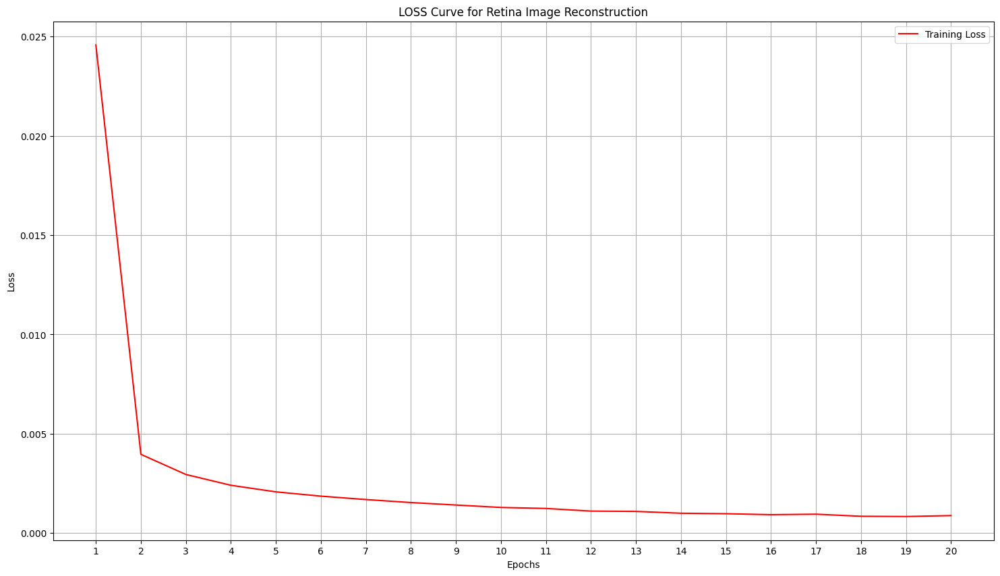

In [19]:
# Extract training loss
train_loss = history.history["loss"]
epochs = list(range(1, EPOCHS + 1))

# Plotting training loss curve
plt.figure(figsize=(18, 10))
plt.plot(epochs, train_loss, '-r', label="Training Loss")
plt.title("LOSS Curve for Retina Image Reconstruction")
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.xticks(epochs)
plt.show()


115/115 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step


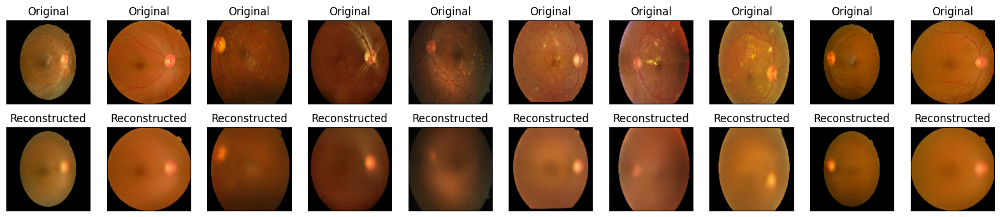

In [20]:
# Use a sample of training images for reconstruction (since no val_imgs)
decoded_imgs = model.predict(train_imgs)

# Number of samples to show
n = 10
plt.figure(figsize=(20, 4))

for i in range(n):
    idx = np.random.randint(0, len(train_imgs))
    
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(train_imgs[idx])
    plt.title("Original")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructed
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[idx])
    plt.title("Reconstructed")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()


In [21]:
import tensorflow as tf

# Set noise level
noise_factor = 0.3

# Add Gaussian noise to the training images
train_noisy_imgs = train_imgs + noise_factor * tf.random.normal(shape=train_imgs.shape)

# Clip values to maintain valid pixel range [0, 1]
train_noisy_imgs = tf.clip_by_value(train_noisy_imgs, clip_value_min=0., clip_value_max=1.)


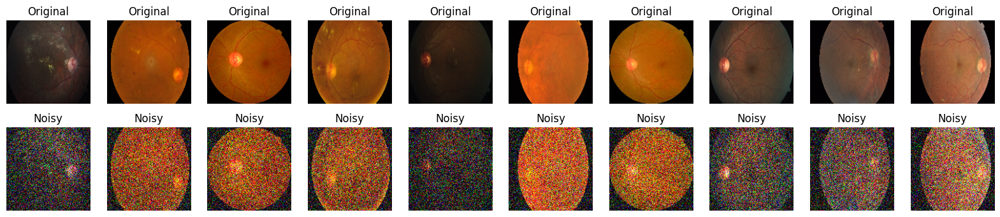

In [22]:
import matplotlib.pyplot as plt

n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
    idx = np.random.randint(0, len(train_imgs))
    
    # Original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(train_imgs[idx])
    plt.title("Original")
    plt.axis('off')

    # Noisy
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(train_noisy_imgs[idx])
    plt.title("Noisy")
    plt.axis('off')

plt.show()


In [23]:
IMG_SHAPE = (128, 128, 3)

retina_ae = Retina_Autoencoder(
    input_dim=IMG_SHAPE,
    encoder_conv_filters=[32, 64, 64, 64],
    encoder_conv_kernel_size=[3, 3, 3, 3],
    encoder_conv_strides=[2, 2, 2, 2],
    decoder_conv_t_filters=[64, 64, 32, 3],
    decoder_conv_t_kernel_size=[3, 3, 3, 3],
    decoder_conv_t_strides=[2, 2, 2, 2],
    z_dim=128,
    use_batch_norm=False,
    use_dropout=False
)

denoisy_retina_model = retina_ae.build()


Model: "Retina_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_0 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_40 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_41 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_42 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_43 (Activation)      │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Dense)               │ (None, 128)            │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4096)           │       528,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_5 (Reshape)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_0                │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_44 (Activation)      │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_1                │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_45 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_2                │ (None, 64, 64, 32)     │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_46 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_t_3                │ (None, 128, 128, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_47 (Activation)      │ (None, 128, 128, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,239,235 (4.73 MB)

 Trainable params: 1,239,235 (4.73 MB)

 Non-trainable params: 0 (0.00 B)

None


In [24]:
# Training Hyperparameters
LR = 1e-3
BS = 16
EPOCHS = 10

# Compile the Retina Autoencoder model
denoisy_retina_model.compile(loss='mse', optimizer='adam')


In [27]:
# Train the Retina Denoising Autoencoder
denoisy_training_history = denoisy_retina_model.fit(
    train_noisy_imgs,   # Noisy training images (input)
    train_imgs,         # Original clean training images (target)
    epochs=EPOCHS,
    batch_size=BS,
    shuffle=True,
)


Epoch 1/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.0511
Epoch 2/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.0049
Epoch 3/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.0032
Epoch 4/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.0026
Epoch 5/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0022
Epoch 6/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0019
Epoch 7/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.0018
Epoch 8/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0017
Epoch 9/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0015
Epoch 10/10
229/229 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0014


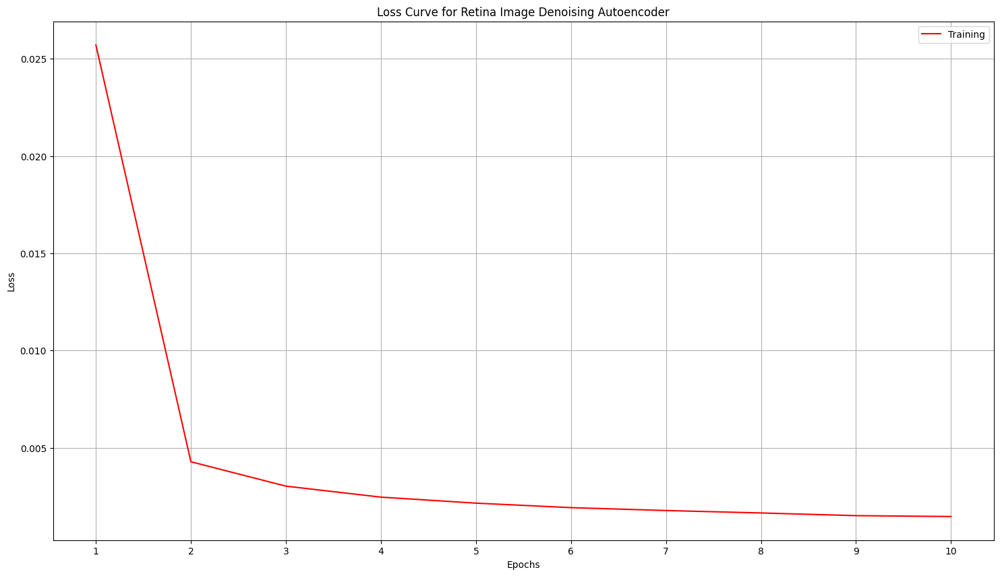

In [28]:
# Storing the training losses
train_loss = denoisy_training_history.history["loss"]
epochs = [d for d in range(1, EPOCHS + 1)]

# Code for plotting only training loss (no validation data used)
plt.figure(figsize=(18, 10))
plt.plot(epochs, train_loss, '-r', label="Training")
plt.title("Loss Curve for Retina Image Denoising Autoencoder")
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.xticks(epochs)
plt.show()


115/115 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step


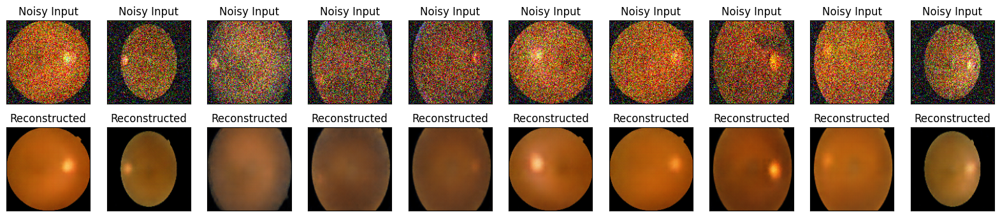

In [30]:
# Predict on noisy training images (as you don't have validation data)
decoded_imgs = denoisy_retina_model.predict(train_noisy_imgs)

# Number of samples to display
n = 10
plt.figure(figsize=(20, 4))

for i in range(n):
    # Select a random index
    idx = np.random.randint(0, len(train_noisy_imgs))

    # Display original + noise
    ax = plt.subplot(2, n, i + 1)
    plt.title("Noisy Input")
    plt.imshow(tf.squeeze(train_noisy_imgs[idx]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    bx = plt.subplot(2, n, i + n + 1)
    plt.title("Reconstructed")
    plt.imshow(tf.squeeze(decoded_imgs[idx]))
    plt.gray()
    bx.get_xaxis().set_visible(False)
    bx.get_yaxis().set_visible(False)

plt.show()
